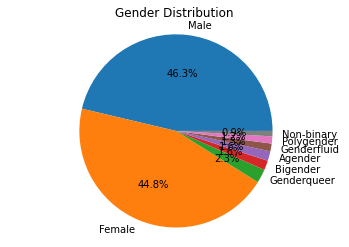

In [1]:
import pandas as pd
import matplotlib.pyplot as plt


flight_data = pd.read_csv('mock_flight_data.csv')
gender_col = flight_data['gender']



gender_counts = gender_col.value_counts()

plt.pie(gender_counts.values, labels=gender_counts.index, autopct='%1.1f%%')
plt.title('Gender Distribution')
plt.axis('equal')
plt.show()


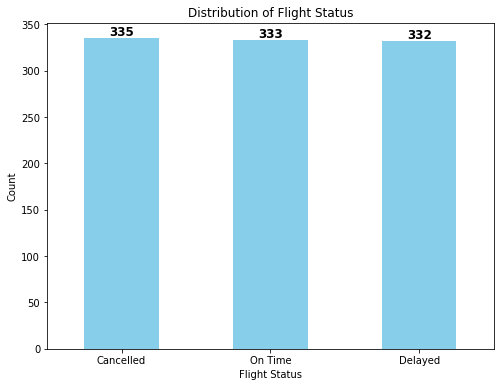

In [8]:
# Histogram of flight status to see distribution of cancelled, delayed, on-time flights

plt.figure(figsize=(8, 6))
flight_data['status'].value_counts().plot(kind='bar', color='skyblue')

# Annotating the bars with the counts
for index, count in enumerate(flight_data['status'].value_counts()):
    plt.text(index, count, str(count), ha='center', va='bottom', fontweight='bold', fontsize=12)

plt.title('Distribution of Flight Status')
plt.xlabel('Flight Status')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

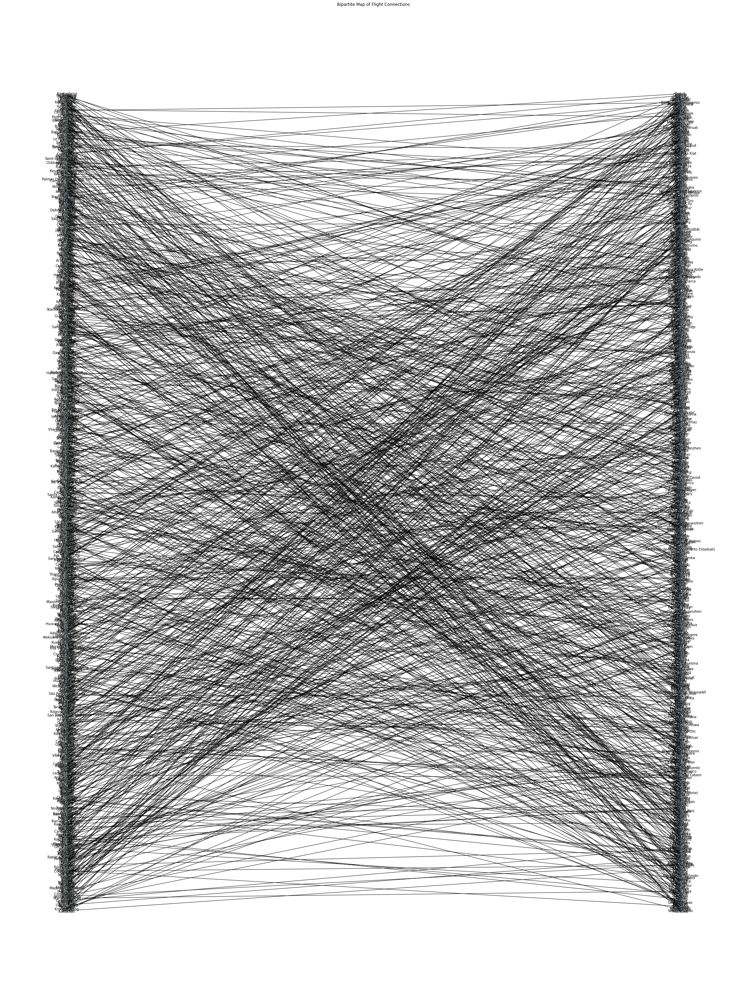

In [28]:
import networkx as nx

# Create a bipartite graph
G = nx.Graph()

# Add nodes for origins and desintations
G.add_nodes_from(flight_data['origin'], bipartite=0)
G.add_nodes_from(flight_data['destination'], bipartite=1)

# Add edges between origins and destinations
edges = [(row['origin'], row['destination']) for _, row in flight_data.iterrows()]
G.add_edges_from(edges)

# Draw the bipartite graph
pos = nx.bipartite_layout(G, nodes=flight_data['origin'], align='vertical')
plt.figure(figsize=(30, 40))
nx.draw(G, pos, node_size=10, node_color='lightblue', with_labels=True, font_size=5)

plt.title('Bipartite Map of Flight Connections')
plt.axis('off')
plt.show()



In [1]:
# Create a scatter plot with longitute and latitude as the x and y axes, going -180~180 and -90~90

# List each origin and destination as a node.
import pandas as pd
import matplotlib.pyplot as plt


flight_data = pd.read_csv('mock_flight_data.csv')

# List of all airports

airports = flight_data['origin'].append(
    flight_data['destination']).drop_duplicates().reset_index(drop=True)
display(airports)
